In [16]:
import pandas as pd
import utils as u
from arctic import Arctic
import matplotlib.pyplot as plt

In [2]:
store = Arctic('localhost')
store.list_libraries()

['test', 'Tick_store']

In [17]:
library = store['Tick_store']
library.list_symbols()

['BTC', 'BTCUSD']

In [18]:
df = library.read('BTCUSD')
### Export relevant range of df
df_original = df.copy()

In [19]:
upper = 37300
lower = 37000
df = df[(df.price > lower) & (df.price < upper)]

In [20]:
price_lvl = df.price.unique()
max_size = df['size'].max(skipna=True)

In [32]:
max_size

3245653

In [21]:
start = df.index[0]
end = df.index[-1]

In [22]:
initial = df[df.index == df.index[0]]
changes = df[df.index != df.index[0]]

In [24]:
ob_initial = u.create_orderbook(initial)
ob_final, ask, bid, time = u.get_bid_ask(changes, ob_initial)

In [31]:
y, x_start, x_end, col = u.create_levels(df, price_lvl, max_size, end)

TypeError: create_levels() takes 2 positional arguments but 4 were given

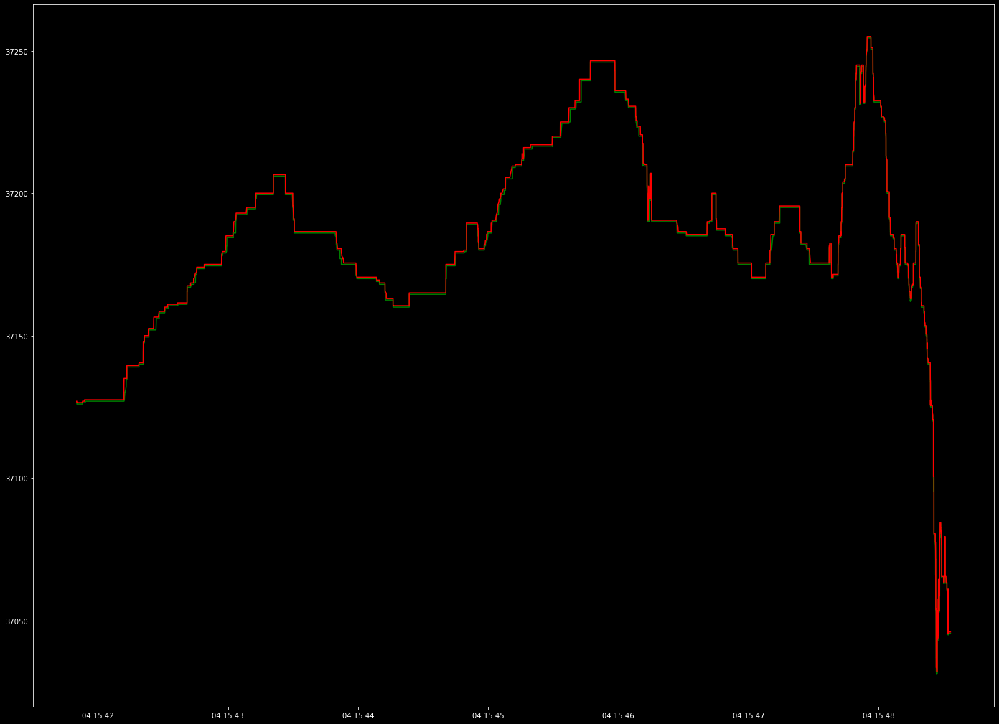

In [179]:
plt.style.use('dark_background')
plt.figure(figsize=(24, 18))
plt.plot(pd.to_datetime(time), best_bid, label='bid', color='g')
plt.plot(pd.to_datetime(time), best_ask, label='ask', color='r')
plt.show()

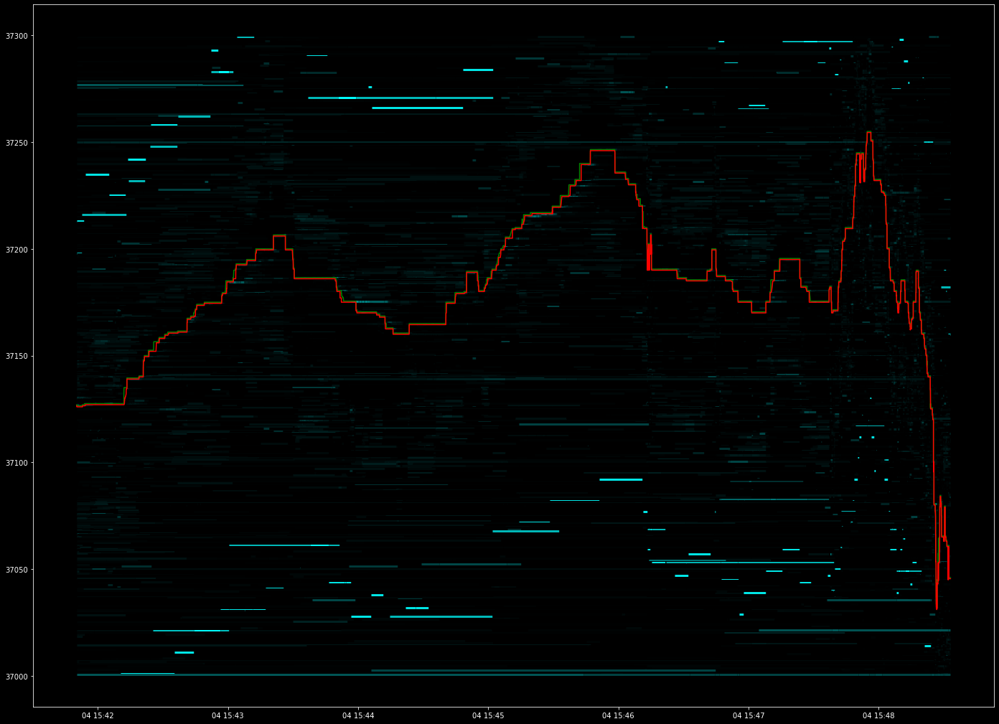

In [15]:
plt.style.use('dark_background')
plt.figure(figsize=(24, 18))
plt.hlines(y, pd.to_datetime(x_start), pd.to_datetime(x_end), lw=3, color=col, alpha=1, zorder=0)
plt.plot(pd.to_datetime(time), bid, label='bid', color='g')
plt.plot(pd.to_datetime(time), ask, label='ask', color='r')
plt.show()